In [14]:
# Importing libraries
using DataFrames
using LinearAlgebra
using Statistics
using XLSX
using Plots
using Random
using Measures

In [15]:
# Downloading and extract the dataset
dataset_file = "DryBeanDataset/Dry_Bean_Dataset.xlsx"

if !isfile(dataset_file)
    run(`wget https://archive.ics.uci.edu/ml/machine-learning-databases/00602/DryBeanDataset.zip`)
    run(`unzip DryBeanDataset.zip`)
    run(`rm DryBeanDataset.zip`)
end

In [16]:
# Importing the dataset
sheet = "Dry_Beans_Dataset"
df = DataFrame(XLSX.readtable(dataset_file, sheet))
df = df[randperm(n), :] # The dataset is sorted by label, I want to remove this bias (mostly for plotting)
df[1:5,:]

Row,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any
1,27883,607.37,217.189,164.023,1.32414,0.655485,28169,188.419,0.78599,0.989847,0.949823,0.867533,0.00778931,0.0027216,0.752614,0.996565,DERMASON
2,66636,989.086,372.434,230.845,1.61335,0.784737,68019,291.279,0.779004,0.979667,0.855954,0.782097,0.00558908,0.00128992,0.611675,0.986845,CALI
3,35214,711.303,269.693,166.731,1.61753,0.786001,35659,211.745,0.718741,0.987521,0.874613,0.785134,0.00765868,0.00179518,0.616435,0.997105,DERMASON
4,42745,767.781,285.624,191.093,1.49468,0.743227,43142,233.291,0.722239,0.990798,0.911214,0.816777,0.00668204,0.00183444,0.667125,0.997139,SIRA
5,80978,1105.56,426.985,243.104,1.75638,0.822094,81742,321.099,0.797679,0.990654,0.832554,0.752015,0.00527285,0.00104023,0.565526,0.993281,CALI


In [17]:
# Extracting data matrix
n = size(df)[1];
m = Matrix(df[:,begin:end-1]);

In [18]:
# Centering and rescaling features
mean = Statistics.mean(m, dims=1)
std = Statistics.std(m, dims=1)
m_standardized = (m.-mean)./std;

In [19]:
# Computing the covariance matrix
c = (transpose(m_standardized)*m_standardized)/n

# Computing eigenvalues and eigenvectors
eig = eigen(c)
eigenvectors = reverse(eig.vectors)
eigenvalues = reverse(eig.values);

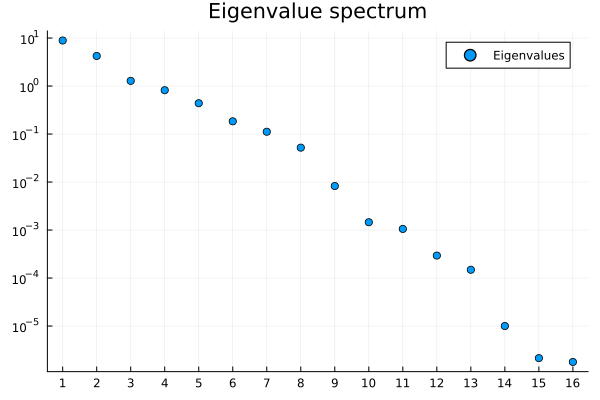

In [20]:
# Plotting the eigenvalue spectrum
plot(eigenvalues,
    seriestype=:scatter,
    label="Eigenvalues",
    xticks=1:length(eigenvalues),
    yscale=:log10,
    yticks=[10.0^i for i in ceil(log10(maximum(eigenvalues))):-1:floor(log10(minimum(eigenvalues)))],
    title = "Eigenvalue spectrum")

In [21]:
# Computing projection on principal components
pc = m_standardized*eigenvectors;

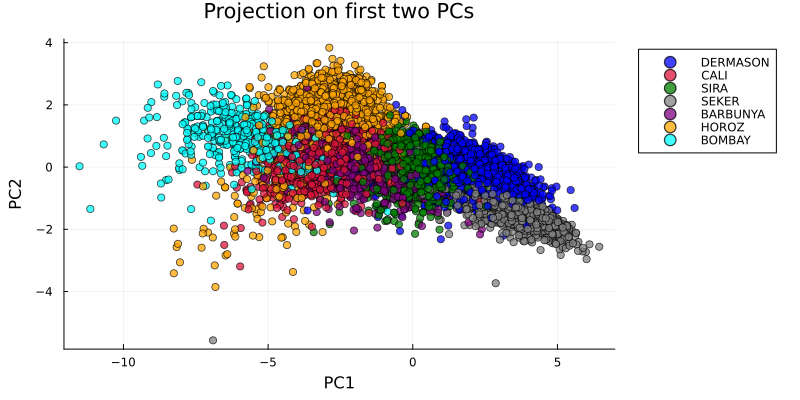

In [22]:
# Plotting data projected on first two principal components
distinguishable_colors = ("blue", "crimson", "green", "gray", "purple", "orange", "cyan")

classes = unique(df.Class)
color_dict = Dict(c => distinguishable_colors[i] for (i,c) in enumerate(classes))
colors = map(class -> color_dict[class], df.Class)

pc_plot = plot(
    pc[:, 1],
    pc[:, 2],
    color = colors,
    alpha=.75,
    xlabel="PC1",
    ylabel="PC2",
    seriestype=:scatter,
    title = "Projection on first two PCs",
    label=nothing
)


# The following is a trick done in order to show the legend
for class in classes
    indexes = (1:n)[df.Class .== class]

    plot!(
        pc[indexes[1:2], 1],
        pc[indexes[1:2], 2],
        color=color_dict[class],
        label = class,
        seriestype=:scatter,
        alpha=0.75,
        legend = :outertopright)
end

plot!(size=(800, 400), margin = 4mm)

pc_plot

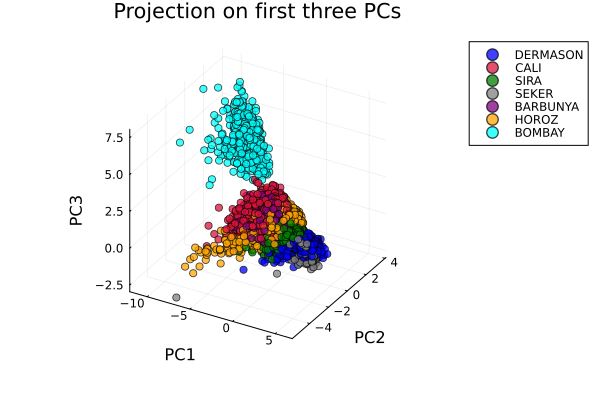

In [23]:
# Plotting data projected on first three principal components
distinguishable_colors = ("blue", "crimson", "green", "gray", "purple", "orange", "cyan")

classes = unique(df.Class)
color_dict = Dict(c => distinguishable_colors[i] for (i,c) in enumerate(classes))
colors = map(class -> color_dict[class], df.Class)

pc_plot = plot(
    pc[:, 1],
    pc[:, 2],
    pc[:, 3],
    color = colors,
    alpha=.75,
    xlabel="PC1",
    ylabel="PC2",
    zlabel="PC3",
    seriestype=:scatter,
    title = "Projection on first three PCs",
    label=nothing
)


# The following is a trick done in order to show the legend
for class in classes
    indexes = (1:n)[df.Class .== class]

    plot!(
        pc[indexes[1:2], 1],
        pc[indexes[1:2], 2],
        pc[indexes[1:2], 3],
        color=color_dict[class],
        label = class,
        seriestype=:scatter,
        alpha=0.75,
        legend = :outertopright)
end

pc_plot

In [24]:
# Saving an interactive 3d plot of the projection on the first three PCs (html) 

import PlotlyJS

plot_df = DataFrame(PC1=pc[:, 1], PC2=pc[:, 2], PC3=pc[:, 3], class=df.Class, color=colors)

pca_plot = PlotlyJS.plot(
    plot_df,
    x = :PC1,
    y = :PC2,
    z = :PC3,
    type = "scatter3d",
    labels=Dict(
        :PC1 => "PC1",
        :PC2 => "PC2",
        :PC3 => "PC3"
    ),
    color = :class,
    mode="markers",
    marker_size=1.5
)

open("./dry_beans_3d_pcs_plot.html", "w") do io
    PlotlyJS.PlotlyBase.to_html(io, pca_plot.plot)
end